# Kriss Sitapara - CS370 Assignment 3

In [ ]:
from IPython.display import HTML
from base64 import b64encode


video_path = './ytdata/football_match.mp4'
video_file = open(video_path, "rb").read()
video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
HTML(f"""
<video width="640" height="480" controls>
    <source src="{video_url}" type="video/mp4">
</video>
""")


Loading the data manually since the other ways like pytube and ytdls didnt work.

In [ ]:
import os
import shutil

# Path to the directory
directory_path = "/content/ytdata/frames"
for filename in os.listdir(directory_path):
    file_path = os.path.join(directory_path, filename)
    try:
        if os.path.isfile(file_path):
            os.remove(file_path)
    except Exception as e:
        print(f"Error deleting file {file_path}: {e}")


directory_path = "/content/ytdata/final"
for filename in os.listdir(directory_path):
    file_path = os.path.join(directory_path, filename)
    try:
        if os.path.isfile(file_path):
            os.remove(file_path)
    except Exception as e:
        print(f"Error deleting file {file_path}: {e}")
shutil.rmtree(directory_path)
os.makedirs(directory_path)
print("All files deleted successfully!")


All files deleted successfully!


This code segments deletes all the subfolders for the frames when the get out of hand

In [ ]:
import cv2
import os

video_path = './ytdata/football_match.mp4'
output_folder = './ytdata/frames/'
os.makedirs(output_folder, exist_ok=True)


cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error: Cannot open video file")
else:
    frame_rate = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    video_duration = int(total_frames / frame_rate)

    frame_interval = total_frames // 132
    frame_count = 0
    saved_frame_count = 0

    print("Extracting frames...")

    while True:
        ret, frame = cap.read()
        if not ret:
            print("End of video.")
            break

        if frame_count % frame_interval == 0 and saved_frame_count < 132:
            frame_filename = os.path.join(output_folder, f"frame_{saved_frame_count:04d}.jpg")
            cv2.imwrite(frame_filename, frame)
            saved_frame_count += 1

        frame_count += 1

    cap.release()
    print(f"Done. Total frames saved: {saved_frame_count}")


Extracting frames...
End of video.
Done. Total frames saved: 132


This code is all about breaking the video into frames so that we can work with individual images instead of the whole video at once. The first part sets the video path and creates a folder to store the extracted frames—this ensures we’re organized. As done in the code, I selected 132 frames for this example which was a good balance of not missing key details and fast performance as well.

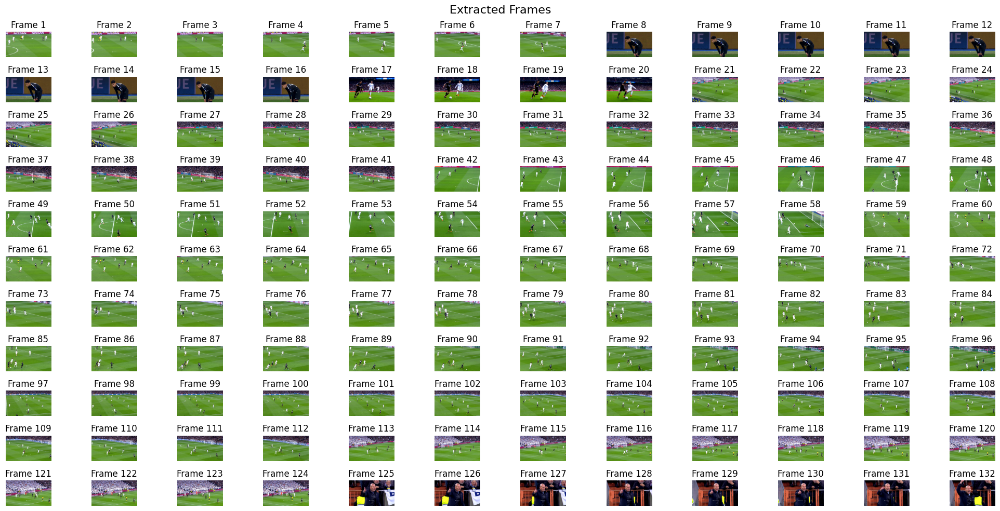

In [ ]:
import matplotlib.pyplot as plt

frames_folder = './ytdata/frames/'
frame_files = sorted([os.path.join(frames_folder, f) for f in os.listdir(frames_folder) if f.endswith('.jpg')])
num_frames = len(frame_files)

rows = 11
cols = 12
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
fig.suptitle("Extracted Frames", fontsize=16)

for i, ax in enumerate(axes.flat):
    if i < num_frames:
        frame = cv2.imread(frame_files[i])
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax.imshow(frame)
        ax.set_title(f"Frame {i+1}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Displaying the frames to visualize

-------------


In [ ]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights

weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()
print("Faster R-CNN model loaded and set to evaluation mode.")


Faster R-CNN model loaded and set to evaluation mode.


Here I load the Faster R-CNN model. So, I am  using PyTorch, specifically from the torchvision library, to grab a pre-trained Faster R-CNN model. The model I am loading has already been trained on the COCO dataset, which is great because it means we don’t have to train it from scratch.

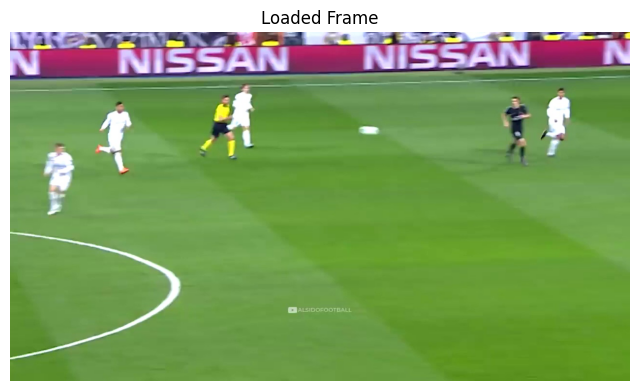

In [ ]:
from PIL import Image
frame_path = './ytdata/frames/frame_0000.jpg'
frame_image = Image.open(frame_path).convert("RGB")
S
plt.figure(figsize=(8, 6))
plt.imshow(frame_image)
plt.axis("off")
plt.title("Loaded Frame")
plt.show()

----------------------------------

In [ ]:
from torchvision.transforms import functional as F

def preprocess_frame(image):
    image_tensor = F.to_tensor(image)
    image_tensor = F.normalize(image_tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    return image_tensor.unsqueeze(0)

preprocessed_frame = preprocess_frame(frame_image)
print(f"Preprocessed Frame Shape: {preprocessed_frame.shape}")


Preprocessed Frame Shape: torch.Size([1, 3, 720, 1280])


In [ ]:
with torch.no_grad():
    predictions = model(preprocessed_frame)[0]

print(f"Predictions: {predictions}")


Predictions: {'boxes': tensor([[1026.0449,  147.2401, 1068.0153,  241.7712],
        [ 718.9113,  192.8864,  765.4664,  213.9893],
        [ 531.2343,  134.9090,  726.9948,  216.0494]]), 'labels': tensor([10, 10,  3]), 'scores': tensor([0.2919, 0.2242, 0.0985])}


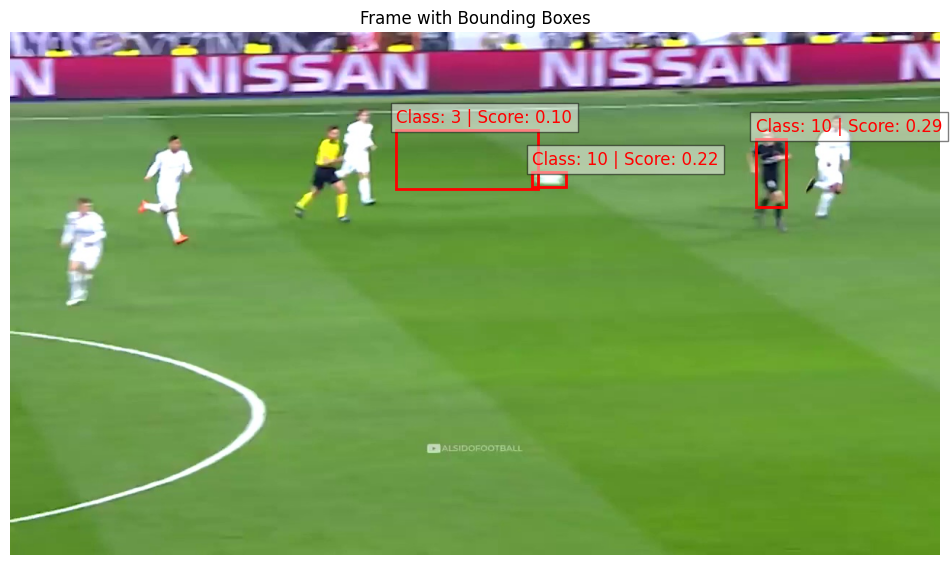

In [ ]:
import matplotlib.patches as patches

def draw_bounding_boxes(image, predictions):
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image)
    for box, label, score in zip(predictions['boxes'], predictions['labels'], predictions['scores']):
        x_min, y_min, x_max, y_max = box.int().tolist()
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        label_text = f"Class: {label.item()} | Score: {score:.2f}"
        ax.text(x_min, y_min - 10, label_text, color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    ax.axis('off')
    plt.title("Frame with Bounding Boxes")
    plt.show()

draw_bounding_boxes(frame_image, predictions)


The above few cells are for processing an image frame and getting predictions from the Faster R-CNN model. First, we preprocess the frame and convert it into a tensor. We then normalize it with mean and standard deviation values (COCO dataset’s defaults).
Once the predictions come out, we see that the model provides bounding boxes, class labels, and confidence scores. These predictions are then passed into a helper function, draw_bounding_boxes, which draws rectangles around the detected objects in the image. Each bounding box is labeled with its class and score to show what the model is detecting

----------------

In [ ]:
import numpy as np

class KalmanFilter:
    def __init__(self):
        self.state = np.zeros(4)
        self.P = np.eye(4) * 1000
        self.Q = np.eye(4) * 0.1

        self.H = np.array([
            [1, 0, 0, 0],
            [0, 1, 0, 0]
        ])


        self.R = np.eye(2) * 10
        self.F = np.array([
            [1, 0, 1, 0],  # x' = x + vx
            [0, 1, 0, 1],  # y' = y + vy
            [0, 0, 1, 0],  # vx' = vx
            [0, 0, 0, 1]   # vy' = vy
        ])

    def predict(self):
        """
        Predict the next state and update the state covariance matrix.
        """
        self.state = np.dot(self.F, self.state)
        self.P = np.dot(np.dot(self.F, self.P), self.F.T) + self.Q
        return self.state[:2]

    def update(self, measurement):
        """
        Update the state based on a new measurement.
        """
        S = np.dot(self.H, np.dot(self.P, self.H.T)) + self.R
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))
        y = measurement - np.dot(self.H, self.state)
        self.state += np.dot(K, y)
        I = np.eye(self.P.shape[0])
        self.P = np.dot(I - np.dot(K, self.H), self.P)

        return self.state[:2]


Here is where I set up the KalmanFilter class. It predicts where an object will be in the next frame and then correcting that prediction using actual data.  

In [ ]:
kf = KalmanFilter()
measurement = np.array([400, 300])
predicted_position = kf.predict()
print(f"Predicted Position: {predicted_position}")
updated_position = kf.update(measurement)
print(f"Updated Position: {updated_position}")


Predicted Position: [0. 0.]
Updated Position: [398.01004925 298.50753694]


This is a test to see if things work or not. I initialize it and then make a prediction without any input and then update it with a new position (400, 300).

In [ ]:
def extract_bounding_box_centers(predictions, confidence_threshold=0.2):
    """
    Extracts the centers of bounding boxes for detected objects with confidence above a threshold.
    """
    centers = []

    for box, label, score in zip(predictions['boxes'], predictions['labels'], predictions['scores']):
        if score >= confidence_threshold:
            x_min, y_min, x_max, y_max = box.tolist()
            center_x = (x_min + x_max) / 2
            center_y = (y_min + y_max) / 2
            centers.append((center_x, center_y))

    return centers


bounding_box_centers = extract_bounding_box_centers(predictions, confidence_threshold=0.2)
print(f"Bounding Box Centers: {bounding_box_centers}")


Bounding Box Centers: [(1047.0300903320312, 194.50566864013672), (742.1888122558594, 203.43785858154297)]


This is where I focus on finding the central points of the detected objects' bounding boxes. I loop through the predictions from the Faster R-CNN model and check if the confidence score of a detection is above a set threshold. If it is, the function calculates the center of the bounding box using the average of its top-left and bottom-right corners. These center points are crucial because they simplify tracking by representing objects as single points instead of full boxes. Although later cause of the several frame it started to get messy so didn't implement it fully.

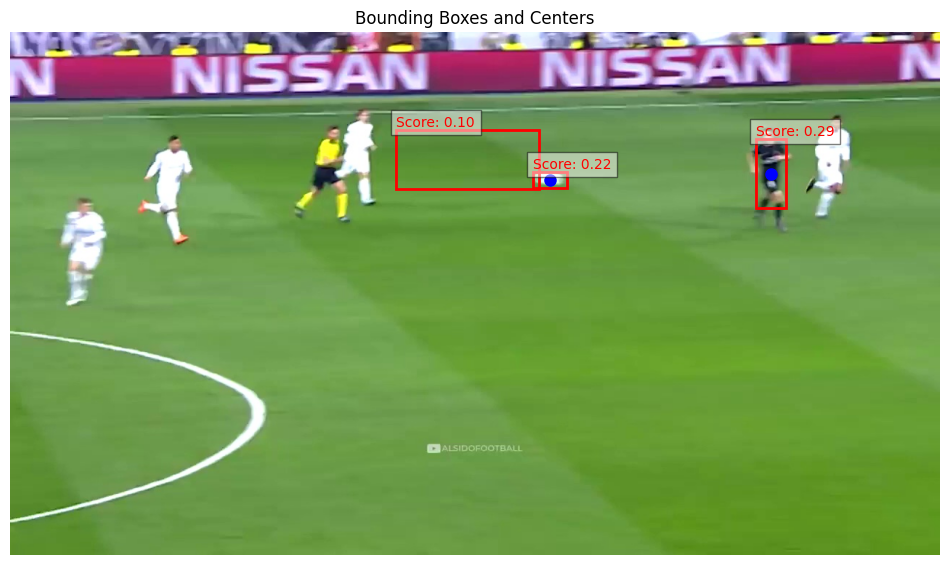

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_centers(image, predictions, centers):
    """
    Visualizes bounding boxes and their centers on the image.
    """
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image)

    for box, score in zip(predictions['boxes'], predictions['scores']):
        x_min, y_min, x_max, y_max = box.tolist()
        rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                         linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, f"Score: {score:.2f}",
                color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    for center in centers:
        ax.plot(center[0], center[1], 'bo', markersize=8, label='Center')

    plt.title("Bounding Boxes and Centers")
    plt.axis("off")
    plt.show()

# Visualize centers on the frame
visualize_centers(frame_image, predictions, bounding_box_centers)


Here i visualize the detections.

-------------


In [ ]:
centers = []
for box in predictions['boxes']:
    x_min, y_min, x_max, y_max = box.tolist()
    center_x = (x_min + x_max) / 2
    center_y = (y_min + y_max) / 2
    centers.append((center_x, center_y))

print(f"Bounding Box Centers: {centers}")

kalman_filters = []
for center in centers:
    kf = KalmanFilter()
    kf.update(np.array(center))
    kalman_filters.append(kf)

print(f"Initialized {len(kalman_filters)} Kalman Filters for detected objects.")


Bounding Box Centers: [(1047.0300903320312, 194.50566864013672), (742.1888122558594, 203.43785858154297), (629.114501953125, 175.47916412353516)]
Initialized 3 Kalman Filters for detected objects.


In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

frames_path = './ytdata/frames/'
output_folder = './ytdata/final/'
os.makedirs(output_folder, exist_ok=True)
frame_files = sorted(os.listdir(frames_path))

for frame_file in frame_files:
    frame_path = os.path.join(frames_path, frame_file)
    frame_image = Image.open(frame_path).convert("RGB")

    preprocessed_frame = preprocess_frame(frame_image)

    with torch.no_grad():
        predictions = model(preprocessed_frame)[0]

    centers = []
    for box in predictions['boxes']:
        x_min, y_min, x_max, y_max = box.tolist()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        centers.append((center_x, center_y))

    for i, center in enumerate(centers):
        if i < len(kalman_filters):
            kalman_filters[i].predict()
            kalman_filters[i].update(np.array(center))
        else:
            kf = KalmanFilter()
            kf.update(np.array(center))
            kalman_filters.append(kf)

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(frame_image)
    for box, score in zip(predictions['boxes'], predictions['scores']):
        x_min, y_min, x_max, y_max = box.tolist()
        rect = plt.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        ax.add_patch(rect)
        ax.text(
            x_min,
            y_min - 10,
            f"Score: {score:.2f}",
            color="red",
            fontsize=10,
            bbox=dict(facecolor="white", alpha=0.5),
        )

    ax.axis("off")
    plt.title(f"Processed Frame: {frame_file}")
    output_path = os.path.join(output_folder, frame_file)
    plt.savefig(output_path, bbox_inches="tight", pad_inches=0)
    plt.close(fig)

print(f"All processed frames are saved in {output_folder}.")


All processed frames are saved in ./ytdata/final/.


This is the main part. For each center, I initialize a Kalman Filter and update it using the center as the first measurement. This essentially prepares the filters to track detected objects across frames. And after that in the next cell, the frames are processed. For each frame, it runs object detection using Faster R-CNN and calculates the bounding box centers. If the Kalman Filter for an object already exists, it predicts the next position and updates it with the new center. Otherwise, a new filter is initialized. After this, bounding boxes and scores are drawn on the frame, and the processed frame is saved

In [ ]:
import cv2
import os
input_folder = './ytdata/final/'
output_video_path = './ytdata/processed_video.mp4'
frame_files = sorted(os.listdir(input_folder))
first_frame_path = os.path.join(input_folder, frame_files[0])
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

fps = 30
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))
print("Reconstructing video from frames...")
for frame_file in frame_files:
    frame_path = os.path.join(input_folder, frame_file)
    frame = cv2.imread(frame_path)
    out.write(frame)
out.release()

print(f"Video saved successfully at {output_video_path}.")


Reconstructing video from frames...
Video saved successfully at ./ytdata/processed_video.mp4.


Saving it back to video format
